# examine the support of community distribution 

In [1]:
import os
import numpy as np

In [2]:
from noah2 import data as D
from noah2 import util as U

In [3]:
import corner as DFM
# --- plotting ---
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False
%matplotlib inline

## examine communities

In [4]:
DNoah = D.Noah2()
fema = DNoah.data[:,1:]

In [5]:
_fema = fema.copy()
_fema[:,2] = np.log10(_fema[:,2]) # log10(median household income)
_fema[:,3] = np.log10(_fema[:,3]) # log10(population)

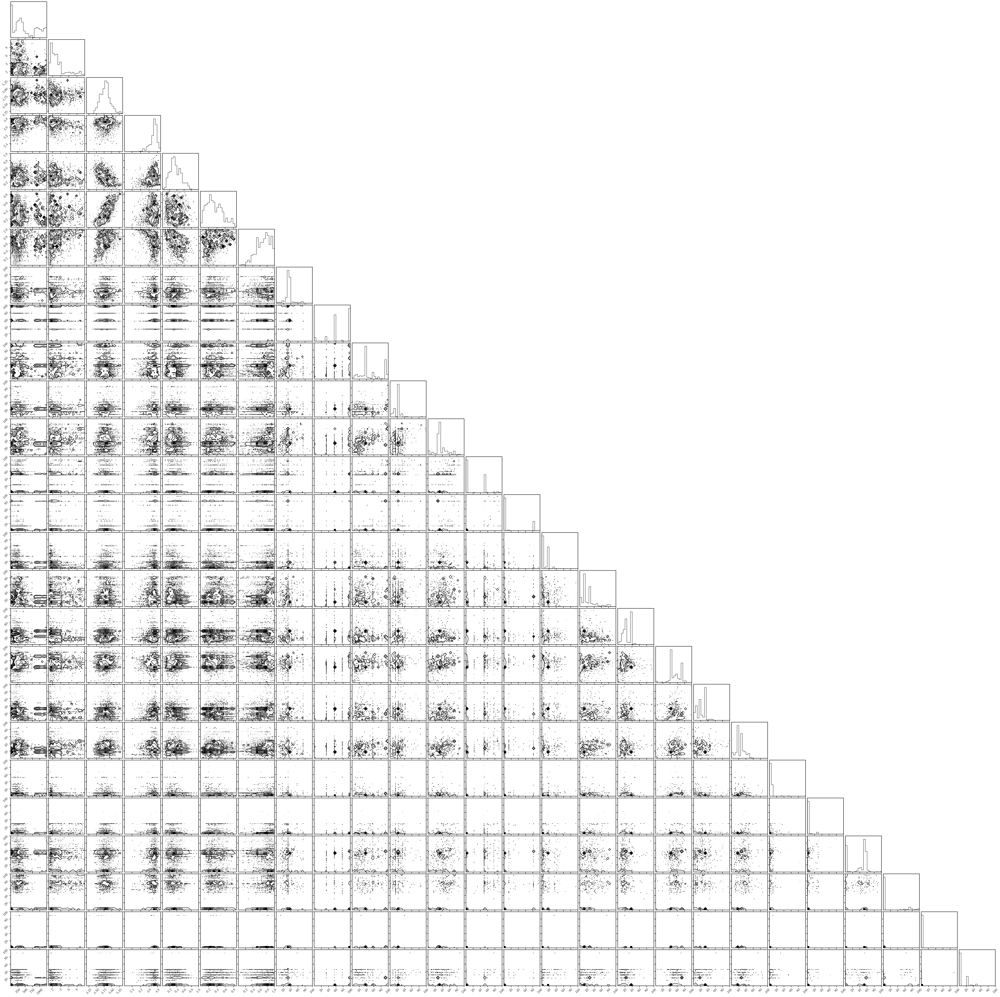

In [6]:
fig = DFM.corner(_fema)

In [8]:
ftrain = '../../dat/nde_support/data.train.npy'
fvalid = '../../dat/nde_support/data.valid.npy'
ftest  = '../../dat/nde_support/data.test.npy'

if ~(os.path.isfile(ftrain) and os.path.isfile(fvalid) and os.path.isfile(ftest)): 

    Ntrain = int(0.8 * len(fema))
    Nvalid = int(0.1 * len(fema))
    Ntest = len(fema) - Ntrain - Nvalid
    

    irandom = np.arange(len(fema))
    np.random.shuffle(irandom)
    
    x_train = fema[irandom][:Ntrain]
    x_valid = fema[irandom][Ntrain:Ntrain+Nvalid]
    x_test = fema[irandom][Ntrain+Nvalid:]
    
    # log10 for income and population 
    x_train[:,2] = np.log10(x_train[:,2])
    x_train[:,3] = np.log10(x_train[:,3])
    x_valid[:,2] = np.log10(x_valid[:,2])
    x_valid[:,3] = np.log10(x_valid[:,3])
    x_test[:,2] = np.log10(x_test[:,2])
    x_test[:,3] = np.log10(x_test[:,3])    
    
    np.save(ftrain, x_train[np.all(np.isfinite(x_train), axis=1)])
    np.save(fvalid, x_valid[np.all(np.isfinite(x_valid), axis=1)])
    np.save(ftest, x_test[np.all(np.isfinite(x_test), axis=1)])
else: 
    x_train = np.load(ftrain)
    x_valid = np.load(fvalid)    
    x_test = np.load(ftest)
    
    Ntrain = x_train.shape[0]
    Nvalid = x_valid.shape[0]
    Ntest = x_test.shape[0]
print('Ntrain = %i, Nvalid = %i, Ntest = %i' % (Ntrain, Nvalid, Ntest))

Ntrain = 158204, Nvalid = 19775, Ntest = 19777


In [9]:
ndim = x_train.shape[1]
print('%i dimensions' % ndim)

26 dimensions


## cdf transformation of the data
The data here have hard ranges. Lets relax this by implementing a CDF transformation

In [10]:
bounds = [
    [-1e-3, 2000.], # mean rainfall
    [0., 10.],   # flood risk score
    [np.log10(1e4), np.log10(2.5e5)], # log10(median household income)
    [np.log10(10), np.log10(2e5)], # log10(population)
    [-1e-3, 1.+1e-3], # renter fraction
    [-1e-3, 1.+1e-3], # education fraction
    [-1e-3, 1.+1e-3] # white fraction
]

for activity in ['s_c310', 's_c320', 's_c330', 's_c340', 's_c350', 's_c360', 's_c370', 
                 's_c410', 's_c420', 's_c430', 's_c440', 's_c450', 
                 's_c510', 's_c520', 's_c530', 's_c540',
                 's_c610', 's_c620', 's_c630']: 
    bounds.append([-1e-3, 100.+1e-3])

In [11]:
fctrain = '../../dat/nde_support/data.train.inv_cdf.npy'
fcvalid = '../../dat/nde_support/data.valid.inv_cdf.npy'
fctest = '../../dat/nde_support/data.test.inv_cdf.npy'

if os.path.isfile(fctrain) and os.path.isfile(fcvalid) and os.path.isfile(fctest):
    cx_train = np.load(fctrain)
    cx_valid = np.load(fcvalid)
    cx_test = np.load(fctest)   
else:
    cx_train = np.empty(x_train.shape)
    cx_valid = np.empty(x_valid.shape)
    cx_test = np.empty(x_test.shape)

    for i in range(ndim): 
        cx_train[:,i] = U.inv_cdf_transform(x_train[:,i], bounds[i])
        cx_valid[:,i] = U.inv_cdf_transform(x_valid[:,i], bounds[i])
        cx_test[:,i] = U.inv_cdf_transform(x_test[:,i], bounds[i])    

    np.save(fctrain, cx_train)
    np.save(fcvalid, cx_valid)
    np.save(fctest, cx_test)

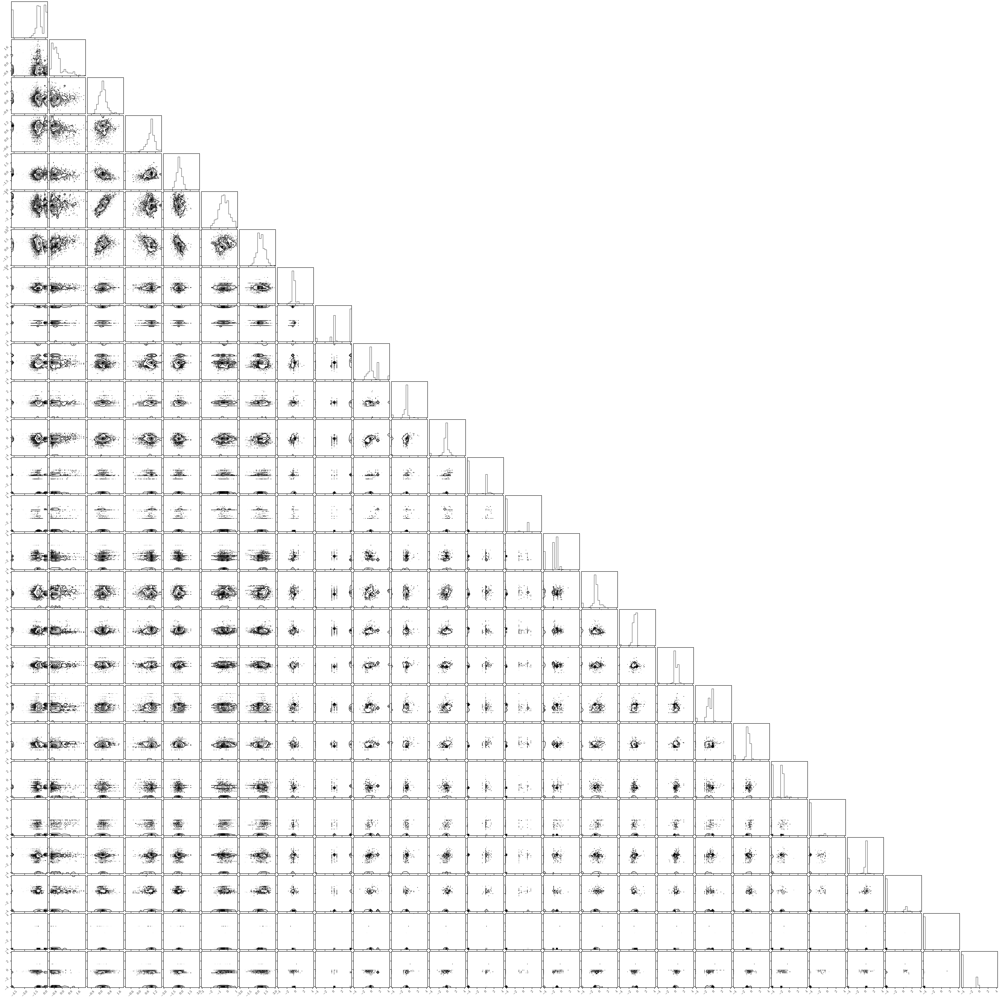

In [44]:
fig = DFM.corner(cx_train)

## train $\mathcal{Q}_\phi(X)$

In [34]:
train_loader = torch.utils.data.DataLoader(torch.tensor(cx_train.astype(np.float32)).to(device), batch_size=512, shuffle=True)
valid_loader = torch.utils.data.DataLoader(torch.tensor(cx_valid.astype(np.float32)).to(device), batch_size=512, shuffle=False)

In [35]:
def init_flow(nhidden, nblocks): 
    ''' initialize flow with input architecture and standard normal base distribution 
    '''
    blocks = []
    for iblock in range(nblocks): 
        blocks += [transforms.MaskedAffineAutoregressiveTransform(features=ndim, hidden_features=nhidden),
                transforms.RandomPermutation(features=ndim)]
    transform = transforms.CompositeTransform(blocks)

    base_distribution = distributions.StandardNormal(shape=[ndim])
    flow = flows.Flow(transform=transform, distribution=base_distribution)
    return flow

In [ ]:
num_iter = 1000
patience = 20
lrate    = 1e-3

all_flows, all_archs, all_valid_losses = [], [], []
for i in range(1): 
    # randomly sample architecture
    nhidden = int(np.ceil(np.random.uniform(64, 128)))
    nblocks = int(np.random.uniform(3, 7))
    print('%ix%i' % (nhidden, nblocks))
    
    flow = init_flow(nhidden, nblocks) 
    flow.to(device)

    optimizer = optim.Adam(flow.parameters(), lr=lrate)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=patience, min_lr=1e-5)
    #optim.lr_scheduler.OneCycleLR(optimizer, lrate, total_steps=num_iter)

    best_epoch, best_valid_loss, valid_losses = 0, np.inf, []
    for epoch in range(num_iter):
        # train 
        train_loss = 0.
        for batch in train_loader: 
            optimizer.zero_grad()
            loss = -flow.log_prob(batch).mean()
            loss.backward()
            train_loss += loss.item()
            optimizer.step()
        train_loss = train_loss/float(len(train_loader))
    
        # validate
        with torch.no_grad():
            valid_loss = 0.
            for batch in valid_loader: 
                loss = -flow.log_prob(batch).mean()
                valid_loss += loss.item()
            valid_loss = valid_loss/len(valid_loader)
            if np.isnan(valid_loss): break
            valid_losses.append(valid_loss)
        scheduler.step(valid_loss)

        if epoch % 10 == 0: 
            print('Epoch: %i LR %.2e TRAINING Loss: %.2e VALIDATION Loss: %.2e' % 
                          (epoch, scheduler._last_lr[0], train_loss, valid_loss))
        if valid_loss < best_valid_loss: 
            best_valid_loss = valid_loss
            best_epoch = epoch
            best_flow = copy.deepcopy(flow)
        else: 
            if epoch > best_epoch + 2*patience: 
                break 

    plt.plot(np.arange(len(valid_losses)), valid_losses)
    plt.xlim(0, len(valid_losses))
    plt.show()
    
    all_archs.append('%ix%i' % (nhidden, nblocks))
    all_flows.append(best_flow)
    all_valid_losses.append(valid_losses)

In [41]:
with torch.no_grad():
    samples = np.array(best_flow.sample(100000).cpu())

In [42]:
np.min(samples[np.all(np.isfinite(samples), axis=1)], axis=0)

array([-2.3688372e+07, -3.0121853e+08, -2.5600824e+09, -1.8750249e+09,
       -1.5161488e+14, -1.6263845e+03, -1.5349835e+06, -2.0048630e+03,
       -1.0879571e+07, -4.9389783e+09, -3.0229041e+10, -3.1527069e+05,
       -1.4922344e+11, -6.6038971e+28, -1.9344047e+25, -3.0456276e+29,
       -1.5158267e+26, -1.8563167e+31, -6.3896461e+04, -1.0345043e+05,
       -4.7531121e+25, -9.0020531e+01, -9.6684406e+04, -9.4341894e+08,
       -1.3715471e+01, -1.8662294e+11], dtype=float32)

In [43]:
np.max(samples[np.all(np.isfinite(samples), axis=1)], axis=0)

array([3.17731820e+07, 5.13568244e+11, 2.71095827e+17, 3.78240762e+11,
       7.60928020e+24, 5.89192880e+25, 2.26567308e+27, 3.38520561e+17,
       4.07810577e+02, 6.34143680e+07, 1.93898394e+09, 7.32556769e+18,
       1.19899368e+19, 1.25460875e+24, 1.30799517e+13, 5.52167386e+29,
       1.31682426e+30, 8.97132100e+06, 1.06181135e+32, 1.13629325e+33,
       6.96240100e+06, 4.87005088e+08, 2.85784400e+34, 9.96268237e+09,
       2.11885991e+36, 5.17086914e+04], dtype=float32)

## validate trained NDE

In [14]:
flosses = glob.glob('../../dat/nde_support/nde_support.v0/*loss')
losses = []
for floss in flosses: 
    with open(floss, 'rb') as f: 
        losses.append(float(f.readline()))
        
ibest = [int(f.split('.')[-2]) for f in flosses][np.argmin(losses)]

print(ibest, np.min(losses))

28 -87.41489703838641


In [15]:
best_flow = torch.load('../../dat/nde_support/nde_support.v0/nde_support.v0.%i.pt' % ibest, map_location=device)

In [20]:
with torch.no_grad():
    samples = np.array(best_flow.sample(100000).cpu())

In [32]:
np.min(samples[np.all(np.isfinite(samples), axis=1)], axis=0)

array([-5.9477837e+01, -5.1309910e+04, -2.8350945e+03, -6.9298424e+01,
       -4.7443194e+08, -4.3971363e+10, -7.4596019e+08, -2.3007480e+07,
       -5.3175459e+15, -7.9022152e+07, -2.4319561e+20, -3.0491230e+04,
       -5.6218380e+22, -1.3888253e+01, -1.1009711e+17, -1.5446456e+18,
       -3.4983763e+29, -3.8965786e+03, -1.8396930e+10, -2.8241889e+04,
       -8.4217405e+09, -3.0347682e+12, -2.1490431e+14, -5.8309555e+01,
       -4.4272708e+16, -4.7518295e+01], dtype=float32)

In [33]:
np.max(samples[np.all(np.isfinite(samples), axis=1)], axis=0)

array([1.7312015e+03, 4.2140480e+04, 2.5911392e+06, 4.3118697e+05,
       9.4620117e+04, 4.0533165e+06, 1.1660763e+14, 4.4082063e+09,
       8.0922491e+09, 1.4038624e+21, 7.4861727e+09, 2.2340364e+23,
       2.4234578e+25, 2.1262958e+27, 1.2340161e+06, 7.6157195e+06,
       2.5497946e+08, 2.8371389e+09, 1.5999746e+11, 2.5749514e+12,
       2.6217170e+13, 4.3909738e+10, 5.2741611e+24, 5.2621721e+26,
       4.4459888e+03, 7.2045325e+28], dtype=float32)

In [26]:
np.min(cx_test, axis=0), np.max(cx_test, axis=0)

(array([-4.89163857, -1.2372346 , -0.84037161, -0.82462833, -3.09082565,
        -3.09082565, -2.08094039, -4.26489526, -4.26489526, -4.26489526,
        -4.26489526, -4.26489526, -4.26489526, -4.26489526, -4.26489526,
        -4.26489526, -4.26489526, -4.26489526, -4.26489526, -4.26489526,
        -4.26489526, -4.26489526, -4.26489526, -4.26489526, -4.26489526,
        -4.26489526]),
 array([0.3069721 , 2.29036788, 1.97639697, 1.65503945, 3.09082565,
        1.13492514, 3.09082565, 4.26489526, 4.26489526, 4.26489526,
        4.26489526, 1.1749488 , 4.26489526, 4.26489526, 1.54346938,
        1.47206683, 4.26489526, 4.26489526, 4.26489526, 4.26489526,
        4.26489526, 0.33267881, 4.26489526, 4.26489526, 4.26489526,
        1.33512773]))

In [28]:
fig = DFM.corner(samples, range=[(m0, m1) for m0, m1 in zip(np.min(cx_train, axis=0), np.max(cx_train, axis=0))])
DFM.overplot_points(fig, cx_test)

Error in callback <function flush_figures at 0x148742fbb5b0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 